In [1]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle

In [2]:
print(torch.cuda.is_available())

True


In [3]:
# Проверяем, доступны ли GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
# Загрузка DataFrame из файла
with open(r'../datasets/seg_maps_dataset.pkl', 'rb') as f:
    df_segmented = pickle.load(f)

with open(r'../datasets/dataset.pkl', 'rb') as f:
    df = pickle.load(f)

In [ ]:
df_segmented

,Matrix,Crystal,Stats,Pulce duration
0,"[[0.1206752, 0.0352278, 0.015067724, 0.0085590...",Al,10000000.0,10.000000
1,"[[0.121290214, 0.035612974, 0.0153458975, 0.00...",Al,10000000.0,25.263158
2,"[[0.118343346, 0.03396949, 0.014400599, 0.0081...",Al,10000000.0,40.526316
3,"[[0.12018201, 0.034963682, 0.014940117, 0.0084...",Al,10000000.0,55.789474
4,"[[0.12682152, 0.038850028, 0.01729071, 0.01014...",Al,10000000.0,71.052632
...,...,...,...,...
3595,"[[0.12536639, 0.03822435, 0.017216044, 0.01036...",Y2O3,500000000.0,238.947368
3596,"[[0.12525474, 0.03805681, 0.016977167, 0.01006...",Y2O3,500000000.0,254.210526
3597,"[[0.12305532, 0.036735777, 0.016140737, 0.0094...",Y2O3,500000000.0,269.473684
3598,"[[0.12257627, 0.036410853, 0.015890166, 0.0092...",Y2O3,500000000.0,284.736842


In [6]:
crystal = df['Crystal']
Crystal = []

for i in crystal:
    i = i[1:]
    foo, fooo = i.split(".")
    i = foo
    #print(i)
    Crystal.append(i)

In [7]:
df['Crystal'] = Crystal
df = df.loc[((df['Crystal'] != 'Ag') & (df['Crystal'] != 'Au') & (df['Crystal'] != 'B4C') & (df['Crystal'] != 'Gd') & (df['Crystal'] != 'H2O_ice_1h') & (df['Crystal'] != 'Hg') & (df['Crystal'] != 'Li') & (df['Crystal'] != 'LiF'))]
df = df.reset_index()
df

,index,Matrix,Crystal,Stats,Pulce duration
0,120,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,10000000.0,10.000000
1,121,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,10000000.0,25.263158
2,122,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,10000000.0,40.526316
3,123,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,10000000.0,55.789474
4,124,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Al,10000000.0,71.052632
...,...,...,...,...,...
3595,4555,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,238.947368
3596,4556,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,254.210526
3597,4557,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,269.473684
3598,4558,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",Y2O3,500000000.0,284.736842


In [14]:
print(df_segmented['Crystal'].unique(), len(df_segmented['Crystal'].unique()))
#print(df_segmented['Stats'].unique(), len(df_segmented['Stats'].unique()))
#print(df_segmented['Pulce duration'].unique(), len(df_segmented['Pulce duration'].unique()))

print(df['Crystal'].unique(), len(df['Crystal'].unique()))
#print(df['Stats'].unique(), len(df['Stats'].unique()))
#print(df['Pulce duration'].unique(), len(df['Pulce duration'].unique()))


['Al' 'Al2O3_sapphire' 'Ba' 'Be' 'BeO' 'C_diamond' 'C_graphite' 'Cr' 'Cs'
 'Cu' 'Cu2MnAl' 'Fe' 'Ga' 'Ge' 'He4_hcp' 'I2' 'K' 'Mo' 'Na2Ca3Al2F14' 'Nb'
 'Ni' 'Pb' 'Pt' 'Rb' 'Si' 'Ti' 'Tl' 'UO2' 'Zn' 'Y2O3'] 30
['Al' 'Al2O3_sapphire' 'Ba' 'Be' 'BeO' 'C_diamond' 'C_graphite' 'Cr' 'Cs'
 'Cu' 'Cu2MnAl' 'Fe' 'Ga' 'Ge' 'He4_hcp' 'I2' 'K' 'Mo' 'Na2Ca3Al2F14' 'Nb'
 'Ni' 'Pb' 'Pt' 'Rb' 'Si' 'Ti' 'Tl' 'UO2' 'Zn' 'Y2O3'] 30


In [8]:
def matrix_multiplication_with_threshold(A, B, threshold=0.1):
    # Применяем пороговое значение: если элемент меньше порога, он становится 0
    A = np.where(A < threshold, 0, A)
    
    # Умножаем матрицы
    result = A * B
    
    return result

In [9]:
resulted_martix = []

for diffraction, segmented_diffraction in zip(df['Matrix'], df_segmented['Matrix']):
    resulted_martix.append(matrix_multiplication_with_threshold(segmented_diffraction, diffraction))

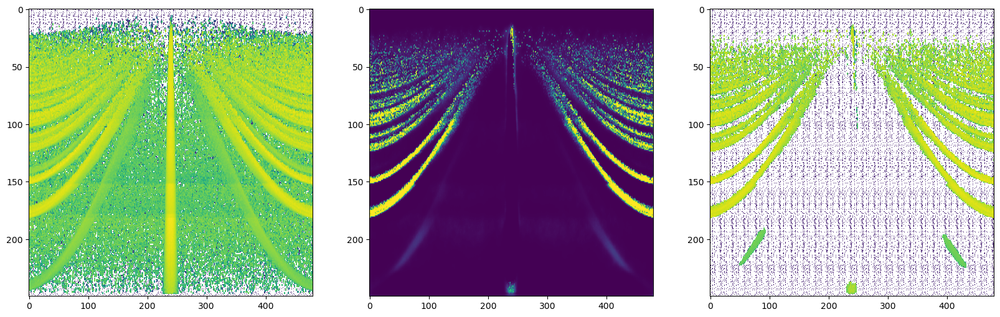

In [10]:
#array([1.e+07, 2.e+07, 5.e+07, 1.e+08, 2.e+08, 5.e+08])
maxStats = 5.e+07
minI = max(df['Pulce duration'].unique())

df_test = df.loc[((df['Stats'] == maxStats) & (df['Pulce duration'] == minI))]
df_test = df_test.reset_index(drop= True)

num = 2003

# Создаем фигуру и оси
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

# Первый график
ax1.imshow(df['Matrix'][num], cmap='viridis', aspect='auto', norm='log')

ax2.imshow(df_segmented['Matrix'][num], cmap='viridis', aspect='auto')

ax3.imshow(resulted_martix[num], cmap='viridis', aspect='auto', norm='log')

plt.show()

In [11]:
import numpy as np
from skimage.transform import resize

def downsample_matrix(matrix, output_shape=(125, 240)):
    """Понижение разрешения матрицы."""
    return resize(matrix, output_shape, mode='reflect', anti_aliasing=True)

matrices_low_res = [downsample_matrix(matrix) for matrix in resulted_martix]

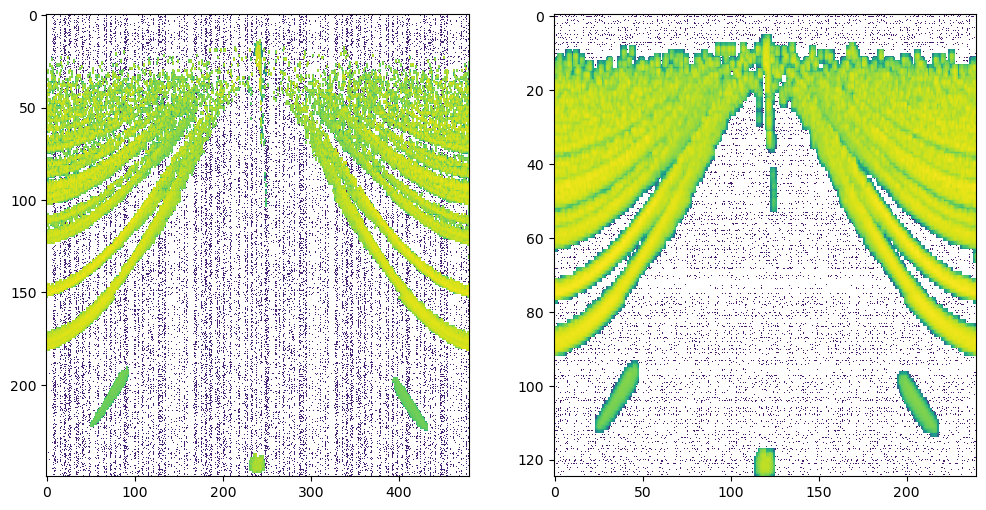

In [12]:
# Создаем фигуру и оси
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

ax1.imshow(resulted_martix[num], cmap='viridis', aspect='auto', norm='log')

ax2.imshow(matrices_low_res[num], cmap='viridis', aspect='auto', norm='log')

plt.show()

In [13]:
from sklearn.model_selection import train_test_split

Diff_high_res_train, Diff_high_res_test, Diff_low_res_train, Diff_low_res_test = train_test_split(resulted_martix, matrices_low_res, test_size=0.1, random_state=42)

In [14]:
# Преобразование данных в тензоры PyTorch
Diff_high_res_train_tensor = torch.FloatTensor(np.array(Diff_high_res_train))
Diff_high_res_train_tensor = Diff_high_res_train_tensor.unsqueeze(1)
Diff_high_res_test_tensor = torch.FloatTensor(np.array(Diff_high_res_test))
Diff_high_res_test_tensor = Diff_high_res_test_tensor.unsqueeze(1)

Diff_low_res_train_tensor = torch.FloatTensor(np.array(Diff_low_res_train))
Diff_low_res_train_tensor = Diff_low_res_train_tensor.unsqueeze(1)
Diff_low_res_test_tensor = torch.FloatTensor(np.array(Diff_low_res_test))
Diff_low_res_test_tensor = Diff_low_res_test_tensor.unsqueeze(1)

print(f'Train high res tensor: {Diff_high_res_train_tensor.size()}')
print(f'Test high res tensor: {Diff_high_res_test_tensor.size()}')
print(f'Train low res tensor: {Diff_low_res_train_tensor.size()}')
print(f'Test low res tensor: {Diff_low_res_test_tensor.size()}')

Train high res tensor: torch.Size([3240, 1, 250, 480])
Test high res tensor: torch.Size([360, 1, 250, 480])
Train low res tensor: torch.Size([3240, 1, 125, 240])
Test low res tensor: torch.Size([360, 1, 125, 240])


In [16]:
from torch.utils.data import TensorDataset, DataLoader, random_split

# Создание набора данных
train_dataset = TensorDataset(Diff_low_res_train_tensor, Diff_high_res_train_tensor)

test_dataset = TensorDataset(Diff_low_res_test_tensor, Diff_high_res_test_tensor)

# Создание DataLoader для каждой выборки
train_loader = DataLoader(train_dataset, batch_size=15, shuffle=True)

test_loader = DataLoader(test_dataset, batch_size=15, shuffle=False)

In [17]:
import torch.nn as nn
import torch.nn.functional as F

def down_block(in_channels, out_channels, 
               kernel_size=4, stride=2, padding=1, 
               apply_batchnorm=True):
    """
    Downsampling-блок:
      Conv2d -> (BatchNorm) -> LeakyReLU
    """
    layers = []
    layers.append(
        nn.Conv2d(in_channels, out_channels, 
                  kernel_size=kernel_size, 
                  stride=stride, 
                  padding=padding, 
                  bias=(not apply_batchnorm))
    )
    if apply_batchnorm:
        layers.append(nn.BatchNorm2d(out_channels))
    layers.append(nn.LeakyReLU(0.2, inplace=True))
    return nn.Sequential(*layers)


def up_block(in_channels, out_channels, 
             kernel_size=4, stride=2, padding=1,
             apply_batchnorm=True, apply_dropout=False):
    """
    Upsampling-блок:
      ConvTranspose2d -> (BatchNorm) -> (Dropout) -> ReLU
    """
    layers = []
    layers.append(
        nn.ConvTranspose2d(in_channels, out_channels, 
                           kernel_size=kernel_size, 
                           stride=stride, 
                           padding=padding,
                           bias=(not apply_batchnorm))
    )
    if apply_batchnorm:
        layers.append(nn.BatchNorm2d(out_channels))
    if apply_dropout:
        layers.append(nn.Dropout(0.5))
    layers.append(nn.ReLU(inplace=True))
    return nn.Sequential(*layers)


class UNetGenerator(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(UNetGenerator, self).__init__()
        
        # --- Down blocks ---
        # out_channels здесь можно подстраивать под желаемую глубину
        self.d1 = down_block(in_channels, 64,  apply_batchnorm=False)  # Первый блок без BatchNorm
        self.d2 = down_block(64, 128)
        self.d3 = down_block(128, 256)
        self.d4 = down_block(256, 512)
        self.d5 = down_block(512, 512)  # "дно" U-Net

        # --- Up blocks ---
        # В up блоках часто применяют dropout на самых "глубоких" слоях
        self.u1 = up_block(512, 512, apply_dropout=True)  # d5 -> u1, skip с d4
        self.u2 = up_block(512 + 512, 256)                # (512 из u1) + (512 из d4)
        self.u3 = up_block(256 + 256, 128)                # (256 из u2) + (256 из d3)
        self.u4 = up_block(128 + 128, 64)                 # (128 из u3) + (128 из d2)
        self.u5 = up_block(64 + 64, 64)                   # (64 из u4) + (64 из d1)
        
        # Дополнительный апсемплинг, чтобы удвоить размер
        self.u6 = up_block(64, 64, apply_batchnorm=False) # Выход: (64, 250, 480)

        # Финальная свертка, чтобы получить 1 канал
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1, stride=1, padding=0)

        # Часто в конце применяют nn.Tanh() или nn.Sigmoid() в зависимости от задачи
        # Но для задач суперрезолюции можно оставить линейный выход
        # self.activation = nn.Tanh()  # например

    def forward(self, x):
        # --- Down ---
        d1_out = self.d1(x)       # (64, 62,120)
        d2_out = self.d2(d1_out)  # (128,31,60)
        d3_out = self.d3(d2_out)  # (256,15,30)
        d4_out = self.d4(d3_out)  # (512,7,15)
        d5_out = self.d5(d4_out)  # (512,3,7)

        # --- Up ---
        u1_out = self.u1(d5_out)                 # (512,7,15)
        u1_out = F.interpolate(u1_out, size=(d4_out.size(2), d4_out.size(3)), mode='bilinear', align_corners=False)
        u1_out = torch.cat([u1_out, d4_out], dim=1)  # (1024,7,15)

        u2_out = self.u2(u1_out)                 # (256,15,30)
        u2_out = F.interpolate(u2_out, size=(d3_out.size(2), d3_out.size(3)), mode='bilinear', align_corners=False)
        u2_out = torch.cat([u2_out, d3_out], dim=1)  # (512,15,30)

        u3_out = self.u3(u2_out)                 # (128,31,60)
        u3_out = F.interpolate(u3_out, size=(d2_out.size(2), d2_out.size(3)), mode='bilinear', align_corners=False)
        u3_out = torch.cat([u3_out, d2_out], dim=1)  # (256,31,60)

        u4_out = self.u4(u3_out)                 # (64,62,120)
        u4_out = F.interpolate(u4_out, size=(d1_out.size(2), d1_out.size(3)), mode='bilinear', align_corners=False)
        u4_out = torch.cat([u4_out, d1_out], dim=1)  # (128,62,120)

        u5_out = self.u5(u4_out)  # (64,125,240)
        u5_out = F.interpolate(u5_out, size=(x.size(2), x.size(3)), mode='bilinear', align_corners=False)

        # Дополнительный апсемплинг до (64,250,480)
        u6_out = self.u6(u5_out)  # (64,250,480)

        # Финальный сверточный слой
        out = self.final_conv(u6_out)  # (1,250,480)

        # Если нужно, можно добавить финальную активацию:
        # out = self.activation(out)
        
        return out

In [18]:
class ConvDiscriminator(nn.Module):
    def __init__(self):
        super(ConvDiscriminator, self).__init__()
        
        # Сверточные слои для извлечения признаков
        self.main = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),  # Пример: 250x480 -> 125x240 или 125x240 -> 62x120
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), 
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(256, 1, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        # Адаптивное усреднение, чтобы привести карту активаций к фиксированному размеру
        # Например, пусть мы хотим всегда получать размер (15, 30)
        self.avgpool = nn.AdaptiveAvgPool2d((15, 30))
        
        # Классификатор: преобразование в вектор и линейный слой
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(15 * 30, 1),
            nn.Sigmoid()
        )
        
    def forward(self, image):
        x = self.main(image)
        # Приводим карту активаций к размеру 15x30 независимо от входного размера
        x = self.avgpool(x)
        x = self.classifier(x)
        return x

In [19]:
sample_gemerator = torch.randn(1, 1, 125, 240)

sample_gemerator.size(2)

125

In [20]:
sample_gemerator = torch.randn(1, 1, 250, 480)

sample_discriminator = torch.randn(1, 1, 250, 480)

generator = UNetGenerator()
discriminator = ConvDiscriminator()

out = generator(sample_gemerator)

print(out.size())

result = discriminator(out)

print(result.size())

torch.Size([1, 1, 500, 960])
torch.Size([1, 1])


In [21]:
# Инициализация генератора и дискриминатора
generator = UNetGenerator()
discriminator = ConvDiscriminator()

In [23]:
criterion = torch.nn.BCELoss()

# Параметры оптимизаторов
lr = 0.0001  # Скорость обучения
beta1 = 0.5  # Параметры для Adam, beta1 = 0.5 часто используется в GAN

In [24]:
# Create optimizers
optimizer = {
    "discriminator": torch.optim.Adam(discriminator.parameters(), 
                                        lr=lr, betas=(0.5, 0.999)),
    "generator": torch.optim.Adam(generator.parameters(),
                                    lr=lr, betas=(0.5, 0.999))
}

In [25]:
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.normal_(m.weight, mean=0.0, std=0.02)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)

# Инициализация весов моделей
generator.apply(weights_init)
discriminator.apply(weights_init)

ConvDiscriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(15, 30))
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=450, out_features=1, bias=True)
    (2): Sigmoid()
  )
)

In [26]:
# Параметры для обучения
num_epochs = 40
history_g = []
history_d = []

generator.to(device)
discriminator.to(device)

ConvDiscriminator(
  (main): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(15, 30))
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=450, out_features=1, bias=True)
    (2): Sigmoid()
  )
)

In [27]:
# Losses & scores
losses_g = []
losses_d = []
real_scores = []
fake_scores = []

for epoch in range(num_epochs):
    loss_d_per_epoch = []
    loss_g_per_epoch = []
    real_score_per_epoch = []
    fake_score_per_epoch = []
    for low_res, high_res in train_loader:
        low_res = low_res.to(device)
        high_res = high_res.to(device)

        # Обучение дискриминатора
        # Оччистка градиентов для дискриминатора
        optimizer["discriminator"].zero_grad()

        # Pass real images through discriminator
        real_preds = discriminator(high_res)
        
        real_targets = torch.ones(high_res.size(0), 1, device=device)
        real_loss = criterion(real_preds, real_targets)
        cur_real_score = torch.mean(real_preds).item()
        
        # Generate fake images
        fake_images =  generator(low_res)


        # Pass fake images through discriminator
        fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
        fake_preds = discriminator(fake_images)

        fake_loss = criterion(fake_preds, fake_targets)
        cur_fake_score = torch.mean(fake_preds).item()

        real_score_per_epoch.append(cur_real_score)
        fake_score_per_epoch.append(cur_fake_score)

        # Update discriminator weights
        loss_d = real_loss + fake_loss
        loss_d.backward(retain_graph=True)
        #loss_d.backward()
        optimizer["discriminator"].step()
        loss_d_per_epoch.append(loss_d.item())


        # Train generator
        # Clear generator gradients
        optimizer["generator"].zero_grad()
        
        # Generate fake images
        fake_images = generator(low_res)

        # Try to fool the discriminator
        preds = discriminator(fake_images)
        targets = torch.ones(high_res.size(0), 1, device=device)
        loss_g = criterion(preds, targets)
        
        # Update generator weights
        loss_g.backward()
        optimizer["generator"].step()
        loss_g_per_epoch.append(loss_g.item())

    # Record losses & scores
    losses_g.append(np.mean(loss_g_per_epoch))
    losses_d.append(np.mean(loss_d_per_epoch))
    real_scores.append(np.mean(real_score_per_epoch))
    fake_scores.append(np.mean(fake_score_per_epoch))

    print(f'Epoch [{epoch}/{num_epochs}], d_loss: {losses_d[-1]}, g_loss: {losses_g[-1]},  real_score: {real_scores[-1]}, fake_score: {fake_scores[-1]}')

Epoch [0/40], d_loss: 0.8704765000277095, g_loss: 1.4432596636039239,  real_score: 0.7210197570147338, fake_score: 0.36483210180368686
Epoch [1/40], d_loss: 0.3291001555475372, g_loss: 3.752719535871788,  real_score: 0.8531234166412441, fake_score: 0.1082098003157794
Epoch [2/40], d_loss: 0.0663004256353748, g_loss: 4.154402730641542,  real_score: 0.97080487675137, fake_score: 0.0347744526160467
Epoch [3/40], d_loss: 0.022081330215937837, g_loss: 4.266861148454525,  real_score: 0.9962571867638164, fake_score: 0.018117699306458235
Epoch [4/40], d_loss: 0.0132889312458078, g_loss: 4.591257271943269,  real_score: 0.998612041550654, fake_score: 0.0118098352231081
Epoch [5/40], d_loss: 0.0715616087998367, g_loss: 4.462529808834747,  real_score: 0.9802496296664079, fake_score: 0.027848855656985607
Epoch [6/40], d_loss: 0.21582107376781534, g_loss: 4.176619786507554,  real_score: 0.9517486468647365, fake_score: 0.07886414612962485
Epoch [7/40], d_loss: 0.06994712476066693, g_loss: 3.318156482

In [28]:
def plot_grad_flow(named_parameters):
    ave_grads = []
    layers = []
    for n, p in named_parameters:
        if(p.requires_grad) and ("bias" not in n):
            layers.append(n)
            ave_grads.append(p.grad.abs().mean().cpu())
    plt.plot(ave_grads, alpha=0.3, color="b")
    plt.hlines(0, 0, len(ave_grads)+1, linewidth=1, color="k" )
    plt.xticks(range(0,len(ave_grads), 1), layers, rotation="vertical")
    plt.xlim(xmin=0, xmax=len(ave_grads))
    plt.xlabel("Layers")
    plt.ylabel("average gradient")
    plt.title("Gradient flow")
    plt.grid(True)

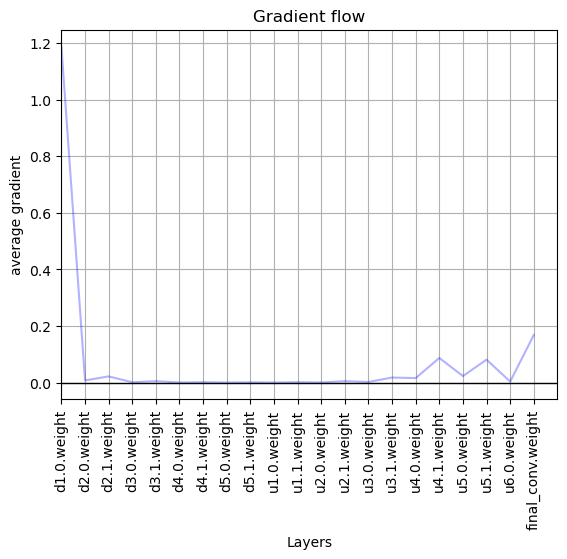

In [29]:
plot_grad_flow(generator.named_parameters())

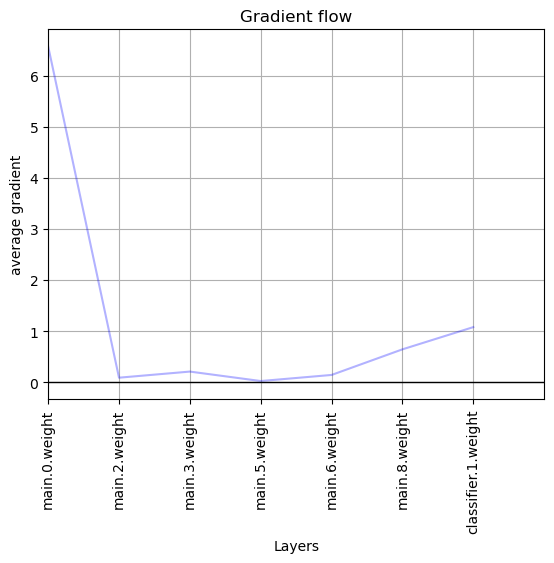

In [30]:
plot_grad_flow(discriminator.named_parameters())

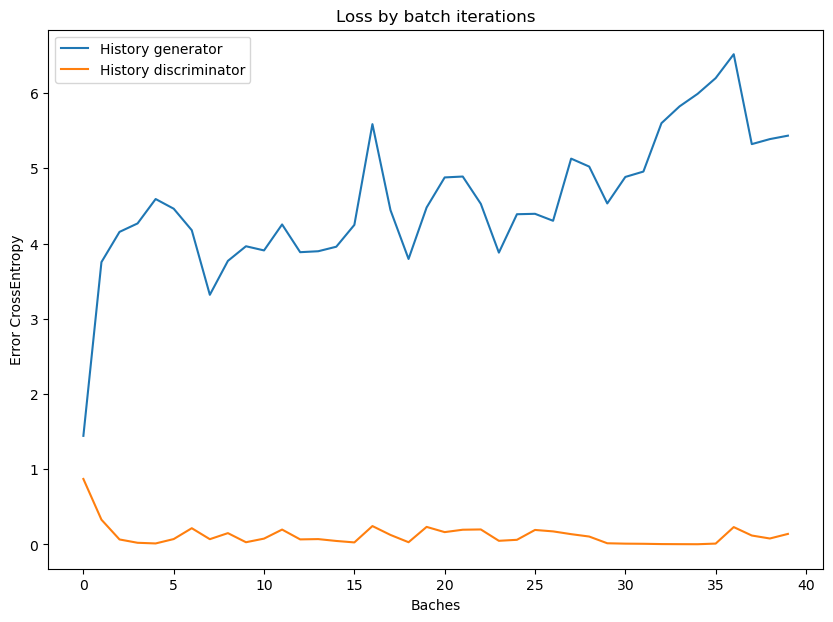

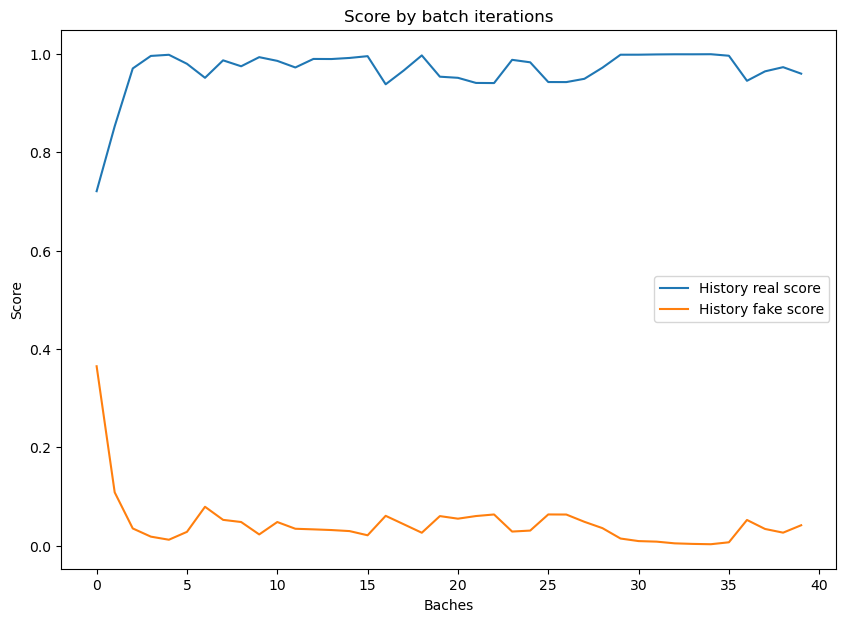

In [31]:
plt.figure(figsize=(10, 7))
plt.plot(losses_g, label = 'History generator')
plt.plot(losses_d, label = 'History discriminator')
plt.title('Loss by batch iterations')
plt.ylabel('Error CrossEntropy')
plt.xlabel('Baches')
#plt.yscale('log')
#plt.xscale('log')
plt.legend()

plt.show()

plt.figure(figsize=(10, 7))
plt.plot(real_scores, label = 'History real score')
plt.plot(fake_scores, label = 'History fake score')
plt.title('Score by batch iterations')
plt.ylabel('Score')
plt.xlabel('Baches')
#plt.yscale('log')
#plt.xscale('log')
plt.legend()

plt.show()

In [42]:
import torch
import torch.nn.functional as F

def psnr(img1, img2, data_range=1.0):
    """
    Вычисляет PSNR между двумя изображениями.
    
    img1, img2: тензоры размера [N, C, H, W] с диапазоном значений [0, data_range].
    data_range: максимальное возможное значение пикселя (например, 1.0, если изображение нормировано).
    """
    mse = torch.mean((img1 - img2) ** 2)
    if mse == 0:
        return float('inf')
    return 10 * torch.log10((data_range ** 2) / mse)


def gaussian(window_size, sigma):
    """
    Генерирует одномерное гауссово окно.
    """
    coords = torch.arange(window_size).float() - window_size // 2
    g = torch.exp(-(coords ** 2) / (2 * sigma ** 2))
    return g / g.sum()


def create_window(window_size, channel, sigma):
    """
    Создаёт 2D гауссово окно для сверточного вычисления SSIM.
    """
    _1D_window = gaussian(window_size, sigma).unsqueeze(1)
    _2D_window = _1D_window @ _1D_window.t()  # матричное произведение для получения 2D окна
    _2D_window = _2D_window.float().unsqueeze(0).unsqueeze(0)
    window = _2D_window.expand(channel, 1, window_size, window_size)
    return window


def ssim(img1, img2, window_size=11, sigma=1.5, data_range=1.0, size_average=True):
    """
    Вычисляет SSIM между двумя изображениями.
    
    img1, img2: тензоры размера [N, C, H, W] с диапазоном значений [0, data_range].
    window_size: размер гауссова окна (обычно 11).
    sigma: стандартное отклонение для гауссова окна (обычно 1.5).
    size_average: если True, возвращается среднее значение SSIM по всему изображению; 
                  иначе — карта SSIM.
    """
    # Определяем число каналов (для одноканальных изображений channel = 1)
    channel = img1.size(1)
    window = create_window(window_size, channel, sigma).to(img1.device)
    
    # Вычисляем локальные средние
    mu1 = F.conv2d(img1, window, padding=window_size // 2, groups=channel)
    mu2 = F.conv2d(img2, window, padding=window_size // 2, groups=channel)
    
    mu1_sq = mu1 ** 2
    mu2_sq = mu2 ** 2
    mu1_mu2 = mu1 * mu2

    # Вычисляем локальные дисперсии и ковариацию
    sigma1_sq = F.conv2d(img1 * img1, window, padding=window_size // 2, groups=channel) - mu1_sq
    sigma2_sq = F.conv2d(img2 * img2, window, padding=window_size // 2, groups=channel) - mu2_sq
    sigma12 = F.conv2d(img1 * img2, window, padding=window_size // 2, groups=channel) - mu1_mu2

    # Константы для числителя и знаменателя (как в оригинальной статье)
    C1 = (0.01 * data_range) ** 2
    C2 = (0.03 * data_range) ** 2

    ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2))
    
    if size_average:
        return ssim_map.mean()
    else:
        return ssim_map
    
PSNR_array = []
SSIM_array = []


with torch.no_grad():
    for low_res, high_res in train_loader:
        low_res = low_res.to(device)
        high_res = high_res.to(device)

        #upscaled_images =  generator(low_res)
        upscaled_images =  F.interpolate(low_res, size=(250, 480), mode='bilinear', align_corners=False)

        
        # Вычисляем PSNR
        psnr_value = psnr(high_res, upscaled_images, data_range=1.0)
        #print("PSNR:", psnr_value.item())
        PSNR_array.append(psnr_value.item())

        # Вычисляем SSIM
        ssim_value = ssim(high_res, upscaled_images, window_size=11, sigma=1.5, data_range=1.0, size_average=True)
        #print("SSIM:", ssim_value.item())
        SSIM_array.append(ssim_value.item())

PSNR_mean = sum(PSNR_array) / len(PSNR_array)
SSIM_mean = sum(SSIM_array) / len(SSIM_array)

print(f'PSNR_mean {PSNR_mean}')
print(f'SSIM_mean {SSIM_mean}')

PSNR_mean -37.52241816344085
SSIM_mean 0.7525519309220491


In [32]:
maxStats = 5.e+08
minI = max(df['Pulce duration'].unique())

df_segmented_test = df_segmented.loc[((df_segmented['Stats'] == maxStats) & (df_segmented['Pulce duration'] == minI))]
df_segmented_test = df_segmented_test.reset_index(drop= True)

df_test = df.loc[((df['Stats'] == maxStats) & (df['Pulce duration'] == minI))]
df_test = df_test.reset_index(drop= True)

print(len(df_segmented_test['Matrix']), len(df_test['Matrix']))

high_res_test1 = []

for diffraction, segmented_diffraction in zip(df_test['Matrix'], df_segmented_test['Matrix']):
    high_res_test1.append(matrix_multiplication_with_threshold(segmented_diffraction, diffraction))

low_res_test1 = [downsample_matrix(matrix) for matrix in high_res_test1]

# Преобразование данных в тензоры PyTorch
high_res_test1_tensor = torch.FloatTensor(high_res_test1)
high_res_test1_tensor = high_res_test1_tensor.unsqueeze(1)

low_res_test1_tensor = torch.FloatTensor(low_res_test1)
low_res_test1_tensor  = low_res_test1_tensor .unsqueeze(1)

print(high_res_test1_tensor.size())
print(low_res_test1_tensor.size())

30 30
torch.Size([30, 1, 250, 480])
torch.Size([30, 1, 125, 240])


C:\Users\neUral\AppData\Local\Temp\ipykernel_3992\1124795950.py:20: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:278.)
  high_res_test1_tensor = torch.FloatTensor(high_res_test1)


In [33]:
low_res_test1_tensor = low_res_test1_tensor.to(device)
high_res_test1_tensor = high_res_test1_tensor.to(device)

output1 = generator(low_res_test1_tensor)
output2 = generator(high_res_test1_tensor)

print(output1.size())
print(output2.size())

torch.Size([30, 1, 250, 480])
torch.Size([30, 1, 500, 960])


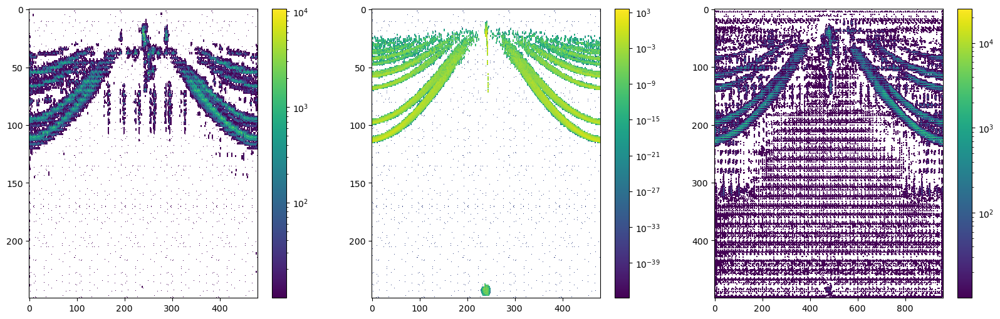

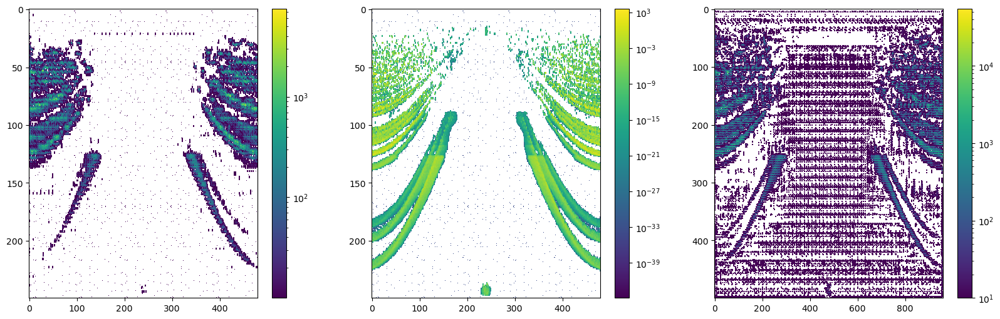

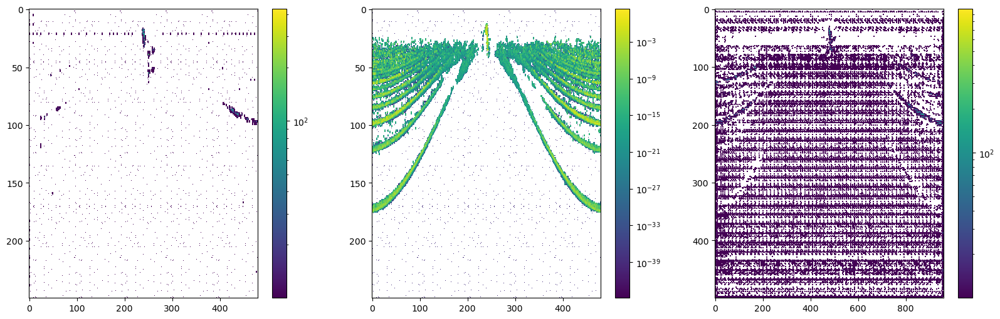

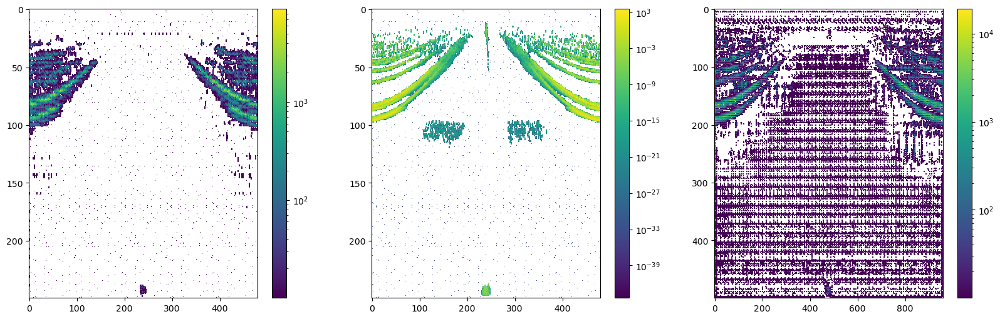

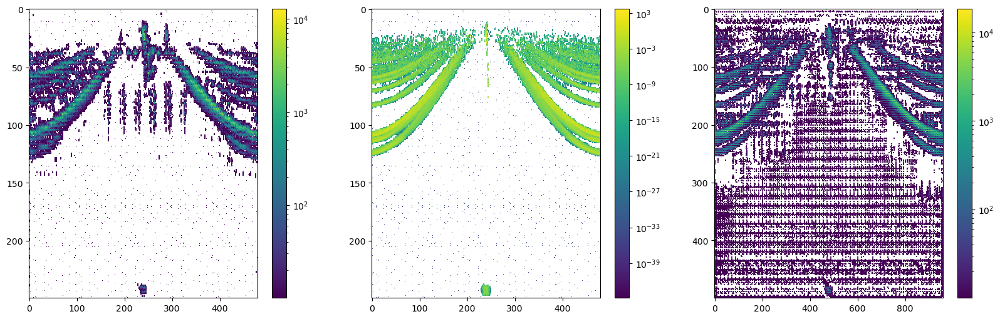

...

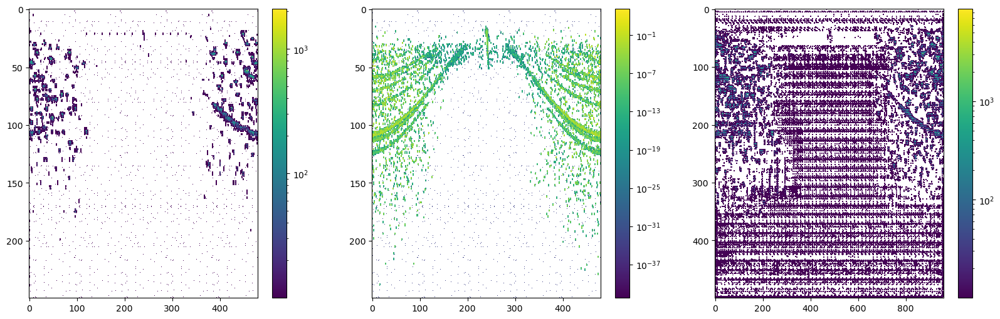

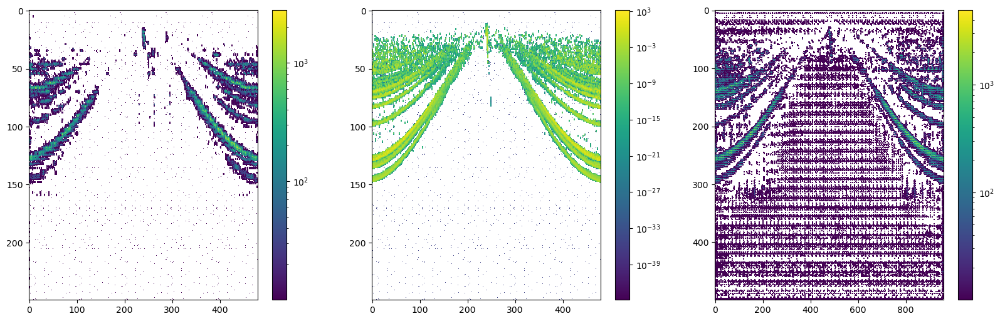

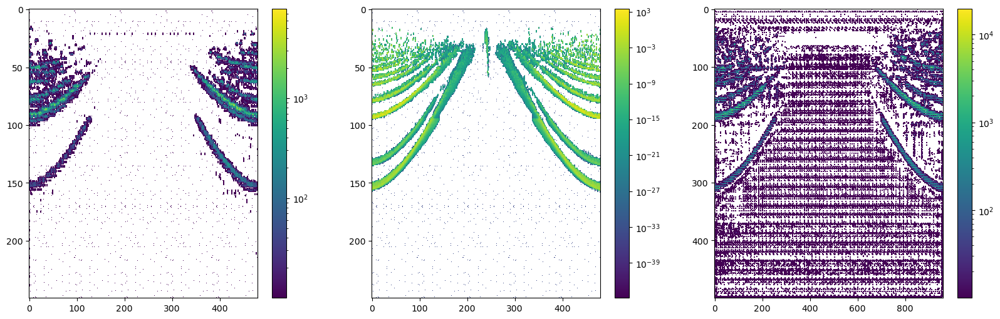

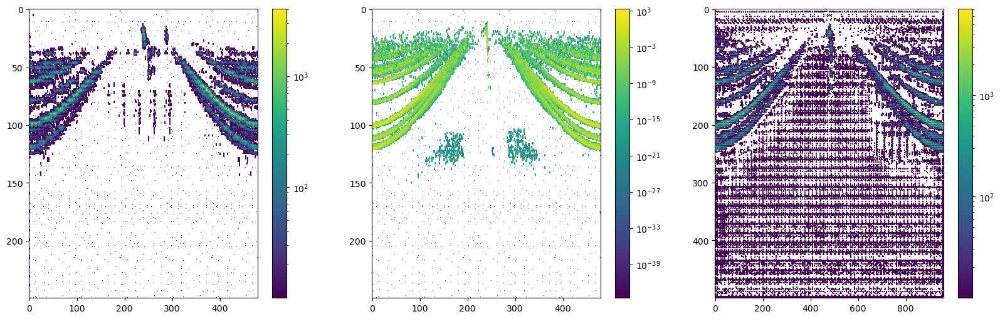

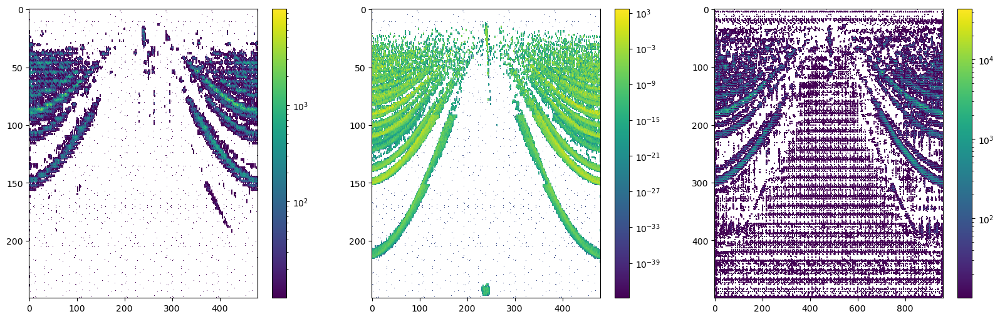

In [39]:
threshold = 10

with torch.no_grad():
    for generator_output1, generator_output2, high_res_real in zip(output1, output2, high_res_test1_tensor):

        # Создаем фигуру и оси
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 6))

        generator_output1 = np.where(generator_output1[0].cpu().numpy() < threshold, 0, generator_output1[0].cpu().numpy())
        generator_output2 = np.where(generator_output2[0].cpu().numpy() < threshold, 0, generator_output2[0].cpu().numpy())


        # Первый график
        im1 = ax1.imshow(generator_output1, cmap='viridis', aspect='auto', norm='log')
        plt.colorbar(im1)

        im2 = ax2.imshow(high_res_real[0].cpu().numpy(), cmap='viridis', aspect='auto', norm='log')
        plt.colorbar(im2)

        im3 = ax3.imshow(generator_output2, cmap='viridis', aspect='auto', norm='log')
        plt.colorbar(im3)
        plt.show()